In [1]:
import numpy as np
import matplotlib.pyplot as plt
from dask_quantumtinkerer import Cluster, cluster_options
import itertools as it
import scipy.sparse.linalg as sla
from collections import OrderedDict
import dask.bag as db

import ccode.solvers as sl
import ccode.kpm as kpm
from ccode.tools import separate_energies_wfs, get_potential
from ccode.plotting import plot_gates, plot_potential_at_barriers, multiline
from ccode.triangular_gates_1 import *
from scipy.sparse import csc_matrix

/opt/conda/lib/python3.9/site-packages/dask_gateway/client.py:21: FutureWarning: format_bytes is deprecated and will be removed in a future release. Please use dask.utils.format_bytes instead.
  from distributed.utils import LoopRunner, format_bytes


VoronoiMesh version 0.1
DiscretePoisson version 0.3
Shape version: 0.1
SystEquations version: 0.3
Solver version 0.1
Finding closed voronoi cells
Done selecting closed voronoi cells
Calculating points distance
Done
Calculating ridges hypersurfaces
Done
Finding  hypervolume for closed voronoi cells
Done finding hypervolume for closed voronoi cells
Done calculating surface
Done calculating distance
Done calculating capacitance matrix


/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


In [2]:
def prepare_voltages(x, elements, fixed_gates={}):
    voltages = OrderedDict()
    for i, element in enumerate(elements):
        voltages[str(element)] = x[i]

    for key, value in fixed_gates.items():
        voltages[key] = value

    return voltages

In [3]:
np.warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)
mu = sl.bands[0]

In [4]:
from ccode.tools import find_cuts

def plot_potential_at_barriers(
    volts, potentials, mu, color_label, title='Potential cut along barriers'
):
    yint = 1e3*volts
    x, potential_cuts_bot = find_cuts(potentials, cut=10e-9)
    potential_cuts_bot = np.array(potential_cuts_bot)
    xs = np.array([x for i in range(len(potential_cuts_bot))])

    fig, ax = plt.subplots(figsize=(10, 4))
    lc1 = multiline(1e9*xs, -1e3*(potential_cuts_bot-mu), yint, cmap='viridis', lw=0.3, ax=ax)

    axcb = fig.colorbar(lc1)
    axcb.set_label(color_label, fontsize=13)
    ax.set_title(title)
    ax.set_ylabel(r'$V-\mu_0$ [mV]')
    ax.set_xlabel(r'x [nm]')
    plt.show()

# Cluster configuration

In [22]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 4
options.extra_path = "/home/jtorresluna/trijunction_design/"

In [23]:
cluster = Cluster(options)

In [24]:
print(
    "http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"
    + cluster.dashboard_link[17:]
)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/1c2eec1497ee4c01a982969698c39ad4/status


In [25]:
client = cluster.get_client()

# Gate configuration

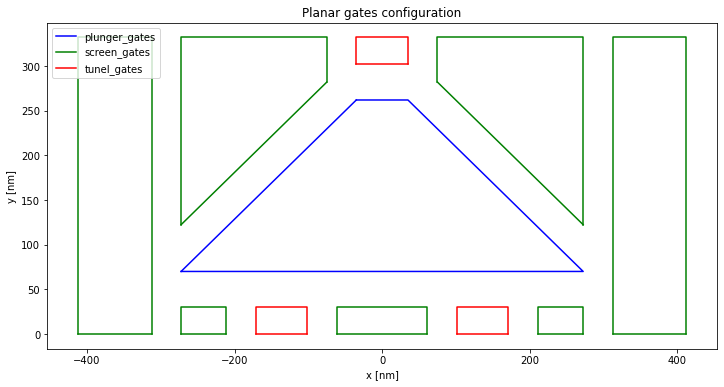

In [5]:
plot_gates(gates)

# Potential setup

In [48]:
def get_voltage_setup_LR():

    depleted = -0.015

    screen_voltages = {
        'left_screen_triangle': depleted,
        'right_screen_triangle': depleted,
        'central_screen_gate': depleted*1.5,
        'left_screen_side': depleted,
        'right_screen_side': depleted,
        'left_screen': depleted,
        'right_screen': depleted
    }

    tunel_voltages = {
        'top_tunel': -0.01,#0.095,
        'left_tunel': 0.022,#-0.07,
        'right_tunel': 0.022 #0.1
    }

    plunger_voltages = {'plunger_gate': 0.007}

    voltage_setup_LR = dict()
    voltage_setup_LR.update(screen_voltages)
    voltage_setup_LR.update(tunel_voltages)
    voltage_setup_LR.update(plunger_voltages)

    volt = list(voltage_setup_LR.values())
    gates = list(voltage_setup_LR.keys())
    voltage_setup_LR = prepare_voltages(volt, gates)

    return voltage_setup_LR

In [49]:
def get_voltage_setup_LC():
    depleted = -0.015

    screen_voltages = {
        'left_screen_triangle': depleted,
        'right_screen_triangle': depleted,
        'central_screen_gate': depleted*1.5,
        'left_screen_side': depleted,
        'right_screen_side': depleted,
        'left_screen': depleted,
        'right_screen': depleted
    }

    tunel_voltages = {
        'top_tunel': 0.022,#0.095
        'left_tunel': 0.022,#-0.07,
        'right_tunel': -0.02 #0.1
    }

    plunger_voltages = {'plunger_gate': 0.006}

    voltage_setup_LC = dict()
    voltage_setup_LC.update(screen_voltages)
    voltage_setup_LC.update(tunel_voltages)
    voltage_setup_LC.update(plunger_voltages)

    volt = list(voltage_setup_LC.values())
    gates = list(voltage_setup_LC.keys())
    voltage_setup_LC = prepare_voltages(volt, gates)

    return voltage_setup_LC

In [50]:
def get_voltage_setup_CR():

    depleted = -0.015

    screen_voltages = {
        'left_screen_triangle': depleted,
        'right_screen_triangle': depleted,
        'central_screen_gate': depleted*1.5,
        'left_screen_side': depleted,
        'right_screen_side': depleted,
        'left_screen': depleted,
        'right_screen': depleted
    }

    tunel_voltages = {
        'top_tunel': 0.02,#0.095,
        'left_tunel': -0.01,#-0.07,
        'right_tunel': 0.02 #0.1
    }

    plunger_voltages = {'plunger_gate': 0.006}

    voltage_setup_CR = dict()
    voltage_setup_CR.update(screen_voltages)
    voltage_setup_CR.update(tunel_voltages)
    voltage_setup_CR.update(plunger_voltages)

    volt = list(voltage_setup_CR.values())
    gates = list(voltage_setup_CR.keys())
    voltage_setup_CR = prepare_voltages(volt, gates)

    return voltage_setup_CR


In [149]:
def plot_potential_as(potential=[], cut=[0.0], cmap="gist_heat_r", scale=1, **kwargs):

    total_potential = []
    for element in potential:
        coordinates = np.array(list(element.keys()))
        values = np.array(list(element.values()))
        total_potential.append(values)

    x = scale*coordinates[:, 0]
    y = scale*coordinates[:, 1]
    width = np.unique(x).shape[0]
    X = x.reshape(width, -1)
    Y = y.reshape(width, -1)
    Z = sum(total_potential).reshape(width, -1)

    fig = plt.figure(figsize=(15, 5))
    ax1 = fig.add_subplot(121)
    cont = ax1.contour(X, Y, Z, cmap=cmap, levels=100, **kwargs)
    cbar1 = fig.colorbar(cont, ax=ax1, format="%.4f")
    ax1.set_xlabel("X [nm]")
    ax1.set_ylabel("Y [nm]")

    ax1 = fig.add_subplot(122)
    for x in cut:
        poten = Z.T[np.argwhere(Y[0] == x)][0][0]
        ax1.plot(X[:, 0], poten)
    ax1.set_xlabel("X [nm]")
    ax1.set_ylabel("potential [eV]")

In [150]:
voltage_setup = get_voltage_setup_LR()

clean_potential = potential(voltage_setup=voltage_setup)
clean_potential.update(
    (key, -1 * value) for key, value in clean_potential.items()
)

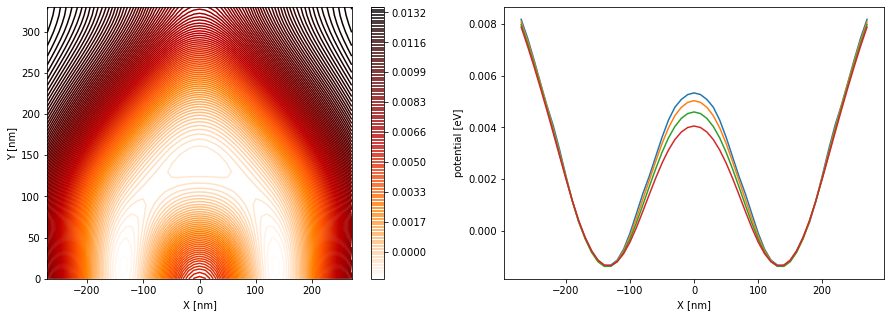

In [151]:
plot_potential_as([clean_potential], [0.0, 10.0, 20.0, 30.0], scale=10)

In [ ]:
voltage_setup = get_voltage_setup_LC()
#voltage_setup['right_tunel'] = -0.05

clean_potential = potential(voltage_setup=voltage_setup)
clean_potential.update(
    (key, -1 * value) for key, value in clean_potential.items()
)

In [ ]:
plot_potential_as([clean_potential], [0.0, 10.0, 20.0, 30.0], scale=10)

In [142]:
voltage_setup = get_voltage_setup_LR()
voltage_setup['top_tunel'] = -0.05

clean_potential = potential(voltage_setup=voltage_setup)
clean_potential.update(
    (key, -1 * value) for key, value in clean_potential.items()
)

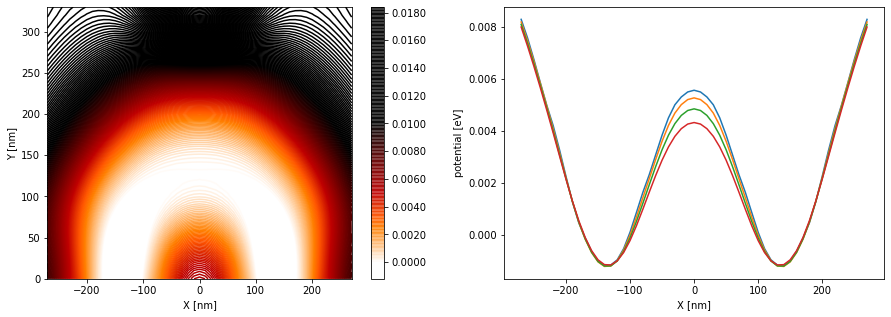

In [143]:
plot_potential_as([clean_potential], [0.0, 10.0, 20.0, 30.0], scale=10, vmin=0, vmax=0.01)

In [30]:
def make_potentials(voltages, parameters, key):
    potentials = {}

    for v in parameters:
        voltages[key] = v
        clean_potential = potential(voltage_setup=voltages, grid_spacing=10e-9)
        potentials[v] = clean_potential

    return potentials

# Set up trijunction

(-1e-07, 4.4e-07)

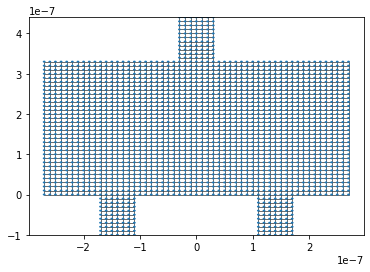

In [17]:
fig, ax = plt.subplots()
kwant.plot(trijunction, ax=ax);
ax.set_ylim(-1e-7, 4.4e-7)

In [18]:
center = 14*10e-9
top = 31*10e-9
barriers = [(center, 10e-9), (-center, 10e-9), (0, top)]

# Left - Right MBS

## Adaptive map

In [19]:
import adaptive
from operator import itemgetter
adaptive.notebook_extension()

In [20]:
def tunnel_crossing(learner, mu, index, tol=1e-4):
    gathered_potentials = {}
    for key, value in learner.extra_data.items():
        gathered_potentials[key] = value['potential']

    crossings = []
    for key, value in gathered_potentials.items():
        if np.abs(value[index]-mu) < tol:
            crossings.append(key)

    return np.array(crossings)[:, ::-1]


def f_line(start, end):
    def f(x):
        m = (end[1]-start[1])/(end[0]-start[0])
        b = start[1] - m*start[0]
        return m*x + b
    return np.vectorize(f)

In [21]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(sl.phase(0))

### Plunger vs tunel gates

In [92]:
voltage_setup_LR = get_voltage_setup_LR()

In [93]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LR,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [94]:
%%time
f((0,0))

CPU times: user 3.89 s, sys: 258 ms, total: 4.15 s
Wall time: 4.14 s


{'eigenvalues': 9.339102054701302e-07,
 'potential': array([-0.00113715, -0.00676472, -0.00896424])}

In [96]:
plunger_min = 2e-3
plunger_max = 10e-3

tunel_min = 0
tunel_max = 40e-3

In [106]:
cluster.scale(n=40)

In [107]:
data_LR = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.003, executor=client)

In [108]:
runner.live_info()

In [109]:
_, _, z = learner.interpolated_on_grid()
data_LR.append(z)

In [110]:
data_LR[0].shape

(324, 324)

Text(0.5, 1.0, 'Left tunnel gate and plunger gate')

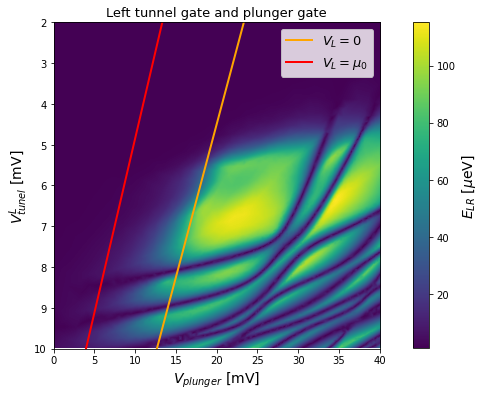

In [248]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LR[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*plunger_max, 1e3*plunger_min), aspect=5)
ax.set_xlabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_ylabel(r'$V_{tunel}^L$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LR}$ [$\mu$eV]', fontsize=14)

x = np.array([0, 40])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-4)
crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1, tol=1e-4)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[3])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[1])

ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(x, f_L_mu(x), label=r'$V_L = \mu_0$', color='red', lw=2)

ax.set_ylim(10, 2)
ax.set_xlim(0, 40)

#ax.scatter(crossings_L_0.T[0]*1e3, crossings_L_0.T[1]*1e3)
#ax.scatter(crossings_L_mu.T[0]*1e3, crossings_L_mu.T[1]*1e3)
ax.legend(fontsize=13)

ax.set_title(r'Left tunnel gate and plunger gate', fontsize=13)

### Left vs Right tunnel gates

In [249]:
voltage_setup_LR = get_voltage_setup_LR()
voltage_setup_LR['plunger_gate'] = 0.007

In [250]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LR,
                              key_1='right_tunel',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [251]:
%%time
f((0,0))

CPU times: user 1.05 s, sys: 58.7 ms, total: 1.11 s
Wall time: 1.11 s


{'eigenvalues': 8.736149399725017e-07,
 'potential': array([-0.00466974, -0.00467028, -0.00691299])}

In [252]:
tunel_min = 0
tunel_max = 40e-3

In [258]:
cluster.scale(n=40)

In [259]:
data_LR_tunnels = []
_learner = adaptive.Learner2D(f, bounds=[(tunel_min, tunel_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.005, executor=client)

In [260]:
runner.live_info()

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x7fdcbc4e4490>>, <Future finished exception=InvalidStateError('CANCELLED: <Future at 0x7fdcadbb4160 state=cancelled>')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.9/site-packages/tornado/gen.py", line 775, in run
    yielded = self.gen.send(value)
  File "/opt/conda/lib/python3.9/site-packages/distributed/cfexecutor.py", line 22, in _cascade_future
    cf_future.set_result(result)
  File "/opt/conda/lib/python3.9/concurrent/futures/_base.py", line 533, in set_result
    raise InvalidStateError('{}: {!r}'.format(self._state, self))
concurrent.futures._base.InvalidStateErro

In [261]:
_, _, z = learner.interpolated_on_grid()
data_LR_tunnels.append(z)

In [262]:
data_LR_tunnels[0].shape

(206, 206)

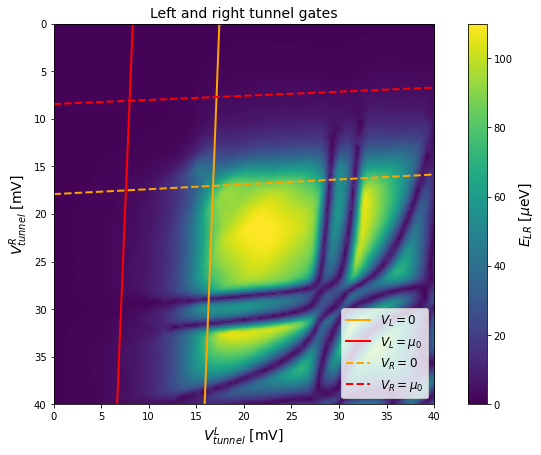

In [280]:
fig, ax = plt.subplots(figsize=(12, 7))

p = ax.imshow(1e6*data_LR_tunnels[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*tunel_max, 1e3*tunel_min),
              vmin=0,
              vmax=110)
ax.set_ylabel(r'$V_{tunnel}^{R}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunnel}^{L}$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LR}$ [$\mu$eV]', fontsize=14)
ax.set_title(r'Left and right tunnel gates', fontsize=14)

x = np.array([0, 40])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-5)
crossings_R_0 = tunnel_crossing(learner, mu=0, index=0, tol=1e-4)

crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1)
crossings_R_mu = tunnel_crossing(learner, mu=-mu, index=0, tol=5e-5)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[5])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[1])
ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(x, f_L_mu(x), label=r'$V_L = \mu_0$', color='red', lw=2)

f_R_0 = f_line(1e3*crossings_R_0[0], 1e3*crossings_R_0[1])
f_R_mu = f_line(1e3*crossings_R_mu[0], 1e3*crossings_R_mu[1])
ax.plot(x, f_R_0(x), color='orange', lw=2, label=r'$V_R=0$', linestyle='--')
ax.plot(x, f_R_mu(x), color='red', lw=2, label=r'$V_R=\mu_0$', linestyle='--')

#ax.scatter(*crossings_L_0.T*1e3)
#ax.scatter(*crossings_R_mu.T*1e3)

#ax.scatter(*crossings_L_mu.T*1e3)
#ax.scatter(*crossings_R_0.T*1e3)

#ax.scatter(crossings_L_0.T[0]*1e3, crossings_L_0.T[1]*1e3)
#ax.scatter(crossings_L_mu.T[0]*1e3, crossings_L_mu.T[1]*1e3)

ax.set_ylim(40, 0)

ax.legend(fontsize=12)

### Plunger vs far tunel gate

In [90]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(sl.phase(0))

In [91]:
voltage_setup_LR = get_voltage_setup_LR()

In [92]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LR,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='top_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [93]:
%%time
f((0,0))

CPU times: user 7.36 s, sys: 69.5 ms, total: 7.43 s
Wall time: 7.42 s


{'eigenvalues': 9.368887000511929e-07,
 'potential': array([-0.00092558, -0.00092628, -0.00635053])}

In [95]:
plunger_min = 4e-3
plunger_max = 10e-3

tunel_min = -100e-3
tunel_max = 0

In [35]:
cluster.scale(n=40)

In [96]:
data_LR = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.005, executor=client)

In [97]:
runner.live_info()

In [98]:
_, _, z = learner.interpolated_on_grid()
data_LR.append(z)

In [99]:
data_LR[0].shape

(209, 209)

Text(0.5, 1.0, 'Central tunnel gate and plunger gate')

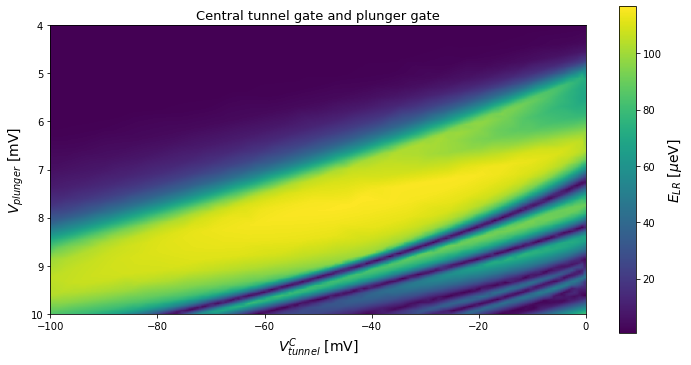

Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/opt/conda/lib/python3.9/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:1129)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/asyncio/events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "/opt/conda/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle_read()
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 1478, in _handle_read
    self._do_ssl_handshak

In [101]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LR[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*plunger_max, 1e3*plunger_min),
              aspect=9)
ax.set_ylabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunnel}^C$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LR}$ [$\mu$eV]', fontsize=14)

x = np.array([0, 50])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=4e-5)
crossings_L_mu = tunnel_crossing(learner, mu=mu, index=1, tol=2e-5)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[-1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[-1])

#ax.plot(x, f_L_0(x-40)[::-1], label=r'$V(x_t,y_t) = 0$', color='orange', lw=2)
#ax.plot(x, f_L_mu(x-40)[::-1], label=r'$V(x_t,y_t) = \mu_0$', color='red', lw=2)

ax.set_title(r'Central tunnel gate and plunger gate', fontsize=13)

## Plunger gate dependence

In [864]:
voltage_setup = get_voltage_setup_LR()

In [865]:
key = 'plunger_gate'
volts = np.linspace(0.004, 0.0086, 100)
potentials_plunger = make_potentials(voltages=voltage_setup,
                                     parameters=volts,
                                     key=key)

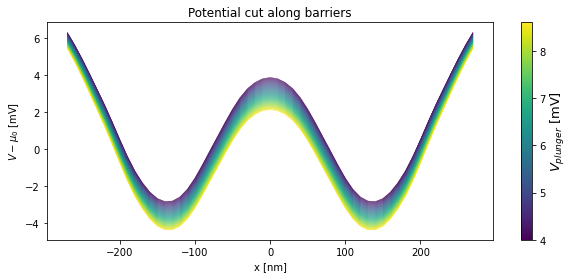

In [866]:
plot_potential_at_barriers(volts=volts,
                           potentials=potentials_plunger,
                           mu=-mu, color_label=r'$V_{plunger}$ [mV]')

In [488]:
n = 10

solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               pair=0,
                               key=key,
                               n=n,
                               eigenvecs=False)

args_db = db.from_sequence(volts, npartitions=20)

In [500]:
cluster.scale(n=20)

In [501]:
%%time
result = args_db.map(solver).compute()

CPU times: user 2.04 s, sys: 72.2 ms, total: 2.12 s
Wall time: 1min 53s


In [502]:
ens_exact_LR_plunger, _ = separate_energies_wfs(result)

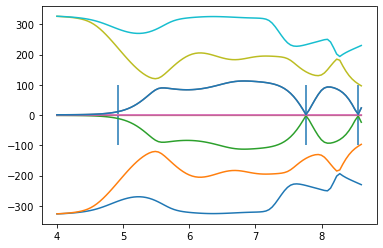

In [513]:
peaks, gs = find_resonances(energies=ens_exact_LR_plunger,
                           n=n,i=2,
                           n_peaks=5, prominence=20e-6)

first_peak = np.where(gs>10e-6)[0][0]
peaks = np.hstack([first_peak, peaks])

fig, ax = plt.subplots()
for level in ens_exact_LR_plunger.T:
    ax.plot(1e3*volts, 1e6*level)

ax.vlines(x=1e3*volts[peaks], ymin=-100, ymax=100)
ax.plot(1e3*volts, 1e6*gs)
#ax.plot(volts_per_level, levels);

In [514]:
averages, widths, centers = average_single_level(ens=ens_exact_LR_plunger, mus=volts)

In [515]:
mean_height = np.round(1e6*np.mean(averages), 2)
mean_width = np.round(1e3*np.mean(widths), 2)

In [517]:
widths

array([0.00283434, 0.0007899 ])

Text(0.5, 0, '$V_{plunger}$ [mV]')

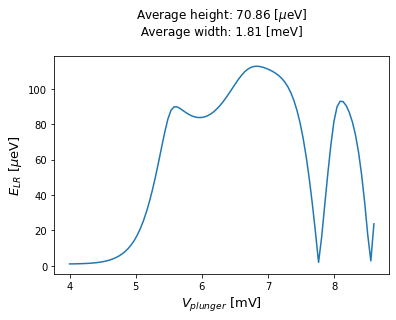

In [520]:
fig, ax = plt.subplots()

title = f'Average height: {mean_height} [$\mu$eV] \n Average width: {mean_width} [meV] \n '
ax.set_title(title)
ax.plot(1e3*volts, 1e6*gs)

ax.set_ylabel(r'$E_{LR}$ [$\mu$eV]', fontsize=13)
ax.set_xlabel(r'$V_{plunger}$ [mV]', fontsize=13)

In [507]:
def average_single_level(ens, mus):

    averages = np.array([np.mean(gs[peaks[i]:peaks[i+1]]) for i in range(len(peaks)-1)])
    widths = np.array([mus[peaks[i+1]]-mus[peaks[i]] for i in range(len(peaks)-1)])
    centers = np.array([mus[peaks[i]]+widths[i]/2 for i in range(len(peaks)-1)])
    return averages, np.abs(widths), centers
    

In [425]:
from ccode.tools import find_resonances



# Left - Top MBS

## Adaptive map

In [16]:
import adaptive
from operator import itemgetter
adaptive.notebook_extension()

In [64]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(sl.phase(1))

### Plunger vs tunel gates

In [383]:
voltage_setup_LC = get_voltage_setup_LC()

In [384]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [385]:
%%time
f((0,0))

CPU times: user 3.09 s, sys: 73.6 ms, total: 3.16 s
Wall time: 3.15 s


{'eigenvalues': 9.270822744722406e-07,
 'potential': array([-0.01184168, -0.00672677, -0.00013684])}

In [386]:
plunger_min = 2e-3
plunger_max = 10e-3

tunel_min = 0
tunel_max = 40e-3

In [101]:
cluster.scale(n=40)

In [387]:
data_LR = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.005, executor=client)

In [388]:
runner.live_info()

distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'f-67139e661fe4e090ca5709a6c2d0b0a3': ()}
distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'f-67139e661fe4e090ca5709a6c2d0b0a3': ()}
tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x7fdcbc4e4490>>, <Future finished exception=CancelledError('f-67139e661fe4e090ca5709a6c2d0b0a3')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.9/site-packages/tornado/gen.py", line 769, in run
    yielded = self.gen.throw(*exc_info)  # type: ignore
  File "/opt/conda/lib/python3.9/site-packages/distributed/cfexecutor.py", line 19, in _cascade_future
    re

In [389]:
_, _, z = learner.interpolated_on_grid()
data_LR.append(z)

In [390]:
data_LR[0].shape

(333, 333)

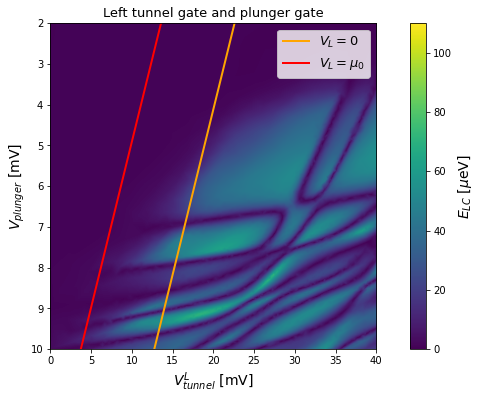

In [394]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LR[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*plunger_max, 1e3*plunger_min),
              aspect=5, vmin=0, vmax=110)
ax.set_ylabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunnel}^L$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LC}$ [$\mu$eV]', fontsize=14)

x = np.array([0, 50])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-5)
crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1, tol=1e-5)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[1])

ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(x, f_L_mu(x), label=r'$V_L = \mu_0$', color='red', lw=2)

ax.set_ylim(10, 2)
ax.set_xlim(0, 40)

ax.set_title(r'Left tunnel gate and plunger gate', fontsize=13)
ax.legend(fontsize=13)

### Left vs Top tunnel gates

In [363]:
voltage_setup_LC = get_voltage_setup_LC()
voltage_setup_LR['plunger_gate'] = 0.007

In [364]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='top_tunel',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [365]:
%%time
f((0,0))

CPU times: user 10.4 s, sys: 115 ms, total: 10.5 s
Wall time: 10.4 s


{'eigenvalues': 8.710421888896767e-07,
 'potential': array([-0.00995221, -0.00483725, -0.00471534])}

In [366]:
tunel_min = 0
tunel_max = 40e-3

In [196]:
cluster.scale(n=40)

In [368]:
data_LC_tunnels = []
_learner = adaptive.Learner2D(f, bounds=[(tunel_min, tunel_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.0025, executor=client)

In [369]:
runner.live_info()

distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'f-e66647f5fb23a0b1476312ab7daa5145': ()}
tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x7fdcbc4e4490>>, <Future finished exception=CancelledError('f-e66647f5fb23a0b1476312ab7daa5145')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.9/site-packages/tornado/gen.py", line 769, in run
    yielded = self.gen.throw(*exc_info)  # type: ignore
  File "/opt/conda/lib/python3.9/site-packages/distributed/cfexecutor.py", line 19, in _cascade_future
    result = yield future._result(raiseit=False)
  File "/opt/conda/lib/python3.9/site-packages/tornado/gen.py", line

In [370]:
_, _, z = learner.interpolated_on_grid()
data_LC_tunnels.append(z)

In [371]:
data_LC_tunnels[0].shape

(377, 377)

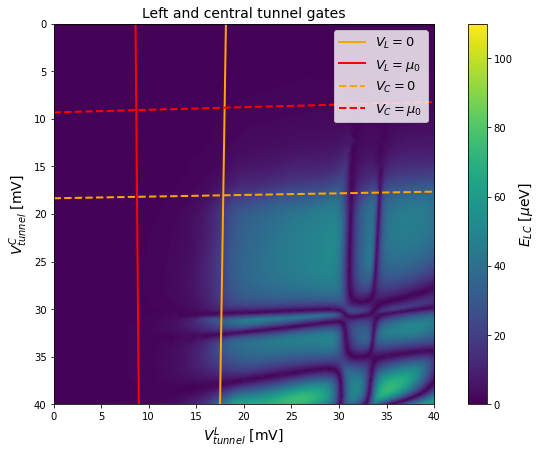

In [374]:
fig, ax = plt.subplots(figsize=(12, 7))

p = ax.imshow(1e6*data_LC_tunnels[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*tunel_max, 1e3*tunel_min),vmin=0, vmax=110)
ax.set_ylabel(r'$V_{tunnel}^{C}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunnel}^{L}$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LC}$ [$\mu$eV]', fontsize=14)
ax.set_title(r'Left and central tunnel gates', fontsize=14)

x = np.array([0, 40])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-5)
crossings_C_0 = tunnel_crossing(learner, mu=0, index=2, tol=4e-6)

crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1)
crossings_C_mu = tunnel_crossing(learner, mu=-mu, index=2)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[-1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[-1])

ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(x, f_L_mu(x), label=r'$V_L = \mu_0$', color='red', lw=2)

f_C_0 = f_line(1e3*crossings_C_0[0], 1e3*crossings_C_0[-1])
f_C_mu = f_line(1e3*crossings_C_mu[0], 1e3*crossings_C_mu[1])

ax.plot(x, f_C_0(x), color='orange', lw=2, label=r'$V_C=0$', linestyle='--')
ax.plot(x, f_C_mu(x), color='red', lw=2, label=r'$V_C=\mu_0$', linestyle='--')

#ax.scatter(*crossings_L_0.T*1e3)
#ax.scatter(*crossings_C_mu.T*1e3)

#ax.scatter(*crossings_L_mu.T*1e3)
#ax.scatter(*crossings_C_0.T*1e3)

#ax.scatter(crossings_L_0.T[0]*1e3, crossings_L_0.T[1]*1e3)
#ax.scatter(crossings_L_mu.T[0]*1e3, crossings_L_mu.T[1]*1e3)

ax.set_ylim(40, 0)
ax.set_xlim(0, 40)

ax.legend(fontsize=13, loc='upper right')

### Plunger vs far tunel gate

In [78]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(sl.phase(1))

In [79]:
voltage_setup_LC = get_voltage_setup_LC()
voltage_setup_LC

OrderedDict([('left_screen_triangle', -0.015),
             ('right_screen_triangle', -0.015),
             ('central_screen_gate', -0.0225),
             ('left_screen_side', -0.015),
             ('right_screen_side', -0.015),
             ('left_screen', -0.015),
             ('right_screen', -0.015),
             ('top_tunel', 0.022),
             ('left_tunel', 0.022),
             ('right_tunel', -0.02),
             ('plunger_gate', 0.006)])

In [80]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='right_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [81]:
%%time
f((0,0))

CPU times: user 6.45 s, sys: 83.3 ms, total: 6.53 s
Wall time: 6.51 s


{'eigenvalues': 9.383818362844481e-07,
 'potential': array([-0.00629168, -0.00073011, -0.00085546])}

In [82]:
plunger_min = 4e-3
plunger_max = 10e-3

tunel_min = -100e-3
tunel_max = 0

In [53]:
cluster.scale(n=40)

In [83]:
data_LC = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.005, executor=client)

In [84]:
runner.live_info()

distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'f-45754f4ea4c3e9f099a5fcfab1da7659': ()}
distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'f-45754f4ea4c3e9f099a5fcfab1da7659': ()}
distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'f-45754f4ea4c3e9f099a5fcfab1da7659': ()}
distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'f-45754f4ea4c3e9f099a5fcfab1da7659': ()}
tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x7fd956745c70>>, <Future finished exception=CancelledError('f-45754f4ea4c3e9f099a5fcfab1da7659')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/p

In [85]:
_, _, z = learner.interpolated_on_grid()
data_LC.append(z)

In [86]:
data_LC[0].shape

(227, 227)

Text(0.5, 1.0, 'Top tunnel gate and plunger gate dependence')

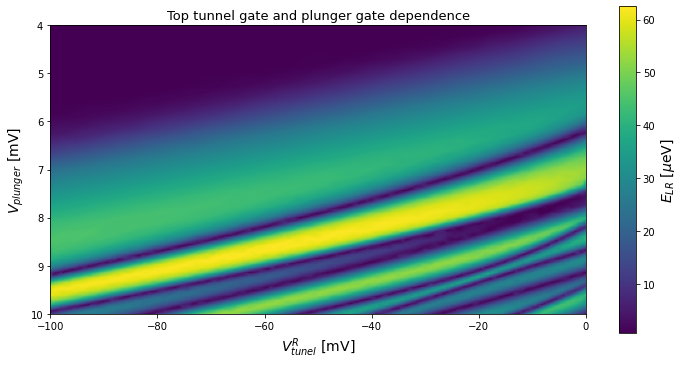

In [89]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LC[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*plunger_max, 1e3*plunger_min),
              aspect=9)
ax.set_ylabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunel}^R$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LR}$ [$\mu$eV]', fontsize=14)

#ax.plot(x, f_L_0(x-40)[::-1], label=r'$V(x_t,y_t) = 0$', color='orange', lw=2)
#ax.plot(x, f_L_mu(x-40)[::-1], label=r'$V(x_t,y_t) = \mu_0$', color='red', lw=2)

ax.set_title(r'Top tunnel gate and plunger gate dependence', fontsize=13)

# Plunger gate dependence

In [857]:
voltage_setup = get_voltage_setup_LC()

In [858]:
key = 'plunger_gate'
volts = np.linspace(0.003, 0.0084, 100)
potentials_plunger = make_potentials(voltages=voltage_setup,
                                     parameters=volts,
                                     key=key)

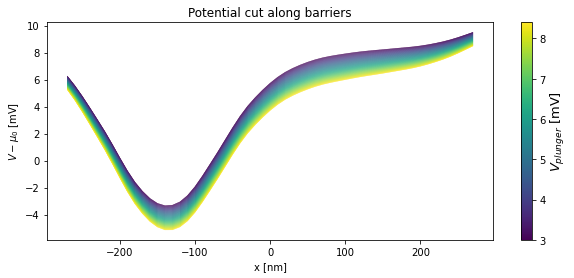

In [859]:
plot_potential_at_barriers(volts=volts,
                           potentials=potentials_plunger,
                           mu=-mu, color_label=r'$V_{plunger}$ [mV]')

In [843]:
n = 10

solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               pair=0,
                               key=key,
                               n=n,
                               eigenvecs=False)

args_db = db.from_sequence(volts, npartitions=20)

In [547]:
solver(0.001)

(array([-3.31423981e-04, -3.30362760e-04, -9.01754977e-07, -8.67804964e-07,
        -8.15870084e-07,  8.15870084e-07,  8.67804964e-07,  9.01754977e-07,
         3.30362760e-04,  3.31423981e-04]),
 [])

In [548]:
%%time
result = args_db.map(solver).compute()

CPU times: user 1.84 s, sys: 28.1 ms, total: 1.87 s
Wall time: 15.9 s


In [549]:
ens_exact_LC_plunger, _ = separate_energies_wfs(result)

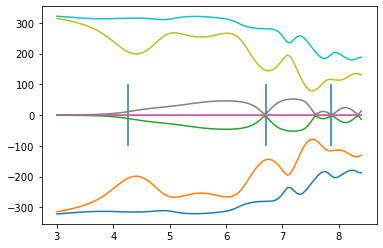

In [550]:
peaks, gs = find_resonances(energies=ens_exact_LC_plunger,
                           n=n,i=2,
                           n_peaks=5, prominence=20e-6)

first_peak = np.where(gs>10e-6)[0][0]
peaks = np.hstack([first_peak, peaks])

fig, ax = plt.subplots()
for level in ens_exact_LC_plunger.T:
    ax.plot(1e3*volts, 1e6*level)

ax.vlines(x=1e3*volts[peaks], ymin=-100, ymax=100)

In [551]:
averages, widths, centers = average_single_level(ens=ens_exact_LC_plunger, mus=volts)

In [552]:
mean_height = np.round(1e6*np.mean(averages), 2)
mean_width = np.round(1e3*np.mean(widths), 2)

In [553]:
widths

array([0.00245455, 0.00114545])

(0.0, 115.0)

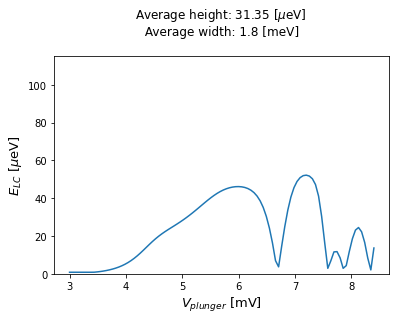

In [554]:
fig, ax = plt.subplots()

title = f'Average height: {mean_height} [$\mu$eV] \n Average width: {mean_width} [meV] \n '
ax.set_title(title)
ax.plot(1e3*volts, 1e6*gs)

ax.set_ylabel(r'$E_{LC}$ [$\mu$eV]', fontsize=13)
ax.set_xlabel(r'$V_{plunger}$ [mV]', fontsize=13)

ax.set_ylim(0, 115)